## I) Figure 10.16

In [1]:
import matplotlib.pyplot as plt
import numpy as np

In [4]:
def mypgmread(filename):
    
    with open(filename, 'rb') as f:
        
        # Dosyanın ilk iki baytınının "P5" olup olmadığını kontrol et
        magic_number = f.readline().decode('ascii').strip()
        assert magic_number == 'P5', 'Invalid PGM'

        
        while True:
            #Dosyadan bir satır oku, ASCII karakterlere çevir, başındaki ve sonundaki boşlukları temizle
            line = f.readline().decode('ascii').strip()
            if not line.startswith('#'):# Yorum satırlarını atla
                break

        # Genişlik, yükseklik ve maksimum değeri oku
        
        width, height = map(int, line.split()) #line adındaki stringi boşluk karakterlerine göre ayırır bu ayrılmış liste üzerinde int fonksiyonunu her bir elemana uygula
        maxval = int(f.readline().decode('ascii').strip())

        image_data = []#Görüntü verisini depolamak için liste oluştur
        
        for _ in range(height):
            row = []
            for _ in range(width):
                pixel_value = ord(f.read(1))#Dosyadan bir bayt oku ve ASCII değere dönüştür
                row.append(pixel_value)
            image_data.append(row)

        return image_data, width, height, maxval

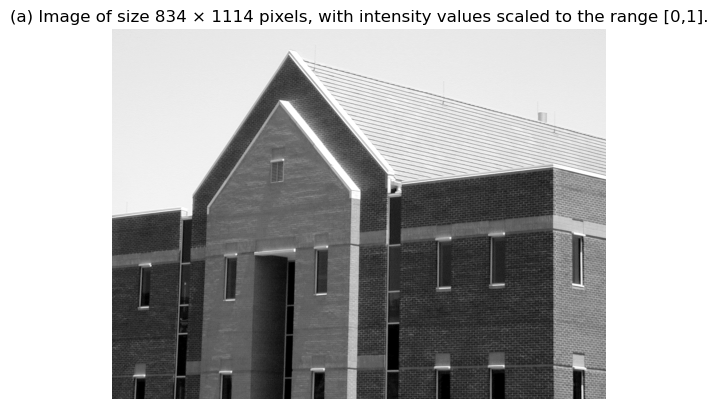

In [6]:
image_data, width, height, maxval = mypgmread('Fig1016(a)(building_original).pgm')

plt.title("(a) Image of size 834 × 1114 pixels, with intensity values scaled to the range [0,1].")
plt.imshow(image_data, cmap='gray')
plt.axis('off') 
plt.show()

In [11]:
def my_filter(data,size,width,height):
    lp_matrix1=np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    

    lp_matrix2=np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])


    data = np.array(data,dtype=np.uint8)
    
    padding = size // 2  # Ekstra sütun/satır sayısı, filtre boyutunun yarısı kadar

    #görüntü kenarındaki pikselleri korumak için 
    w = np.zeros((height + 2*padding, width + 2*padding))# w-> görüntü verisini çerçeveler filtre size ına göre 
    
    for i in range(0,height):    
        for j in range(0,width):
            w[i + padding][j + padding] = data[i][j]
            

    filtered1 = np.zeros((height,width))
    filtered2 = np.zeros((height,width))


    for i in range(0,height):
        for j in range(0,width):
            
            filtered1[i][j] =filtered1[i][j]+ int(np.sum(w[i:size+i,j:size+j]*lp_matrix1))#filtrelenmiş görüntü verisini tutar
            
            filtered2[i][j]= filtered1[i][j]+ int(np.sum(w[i:size+i,j:size+j]*lp_matrix2))#filtrelenmiş görüntü verisini tutar
   
    gradient_magnitude = np.abs(filtered1) + np.abs(filtered2)

        
    return filtered1,filtered2,gradient_magnitude
    

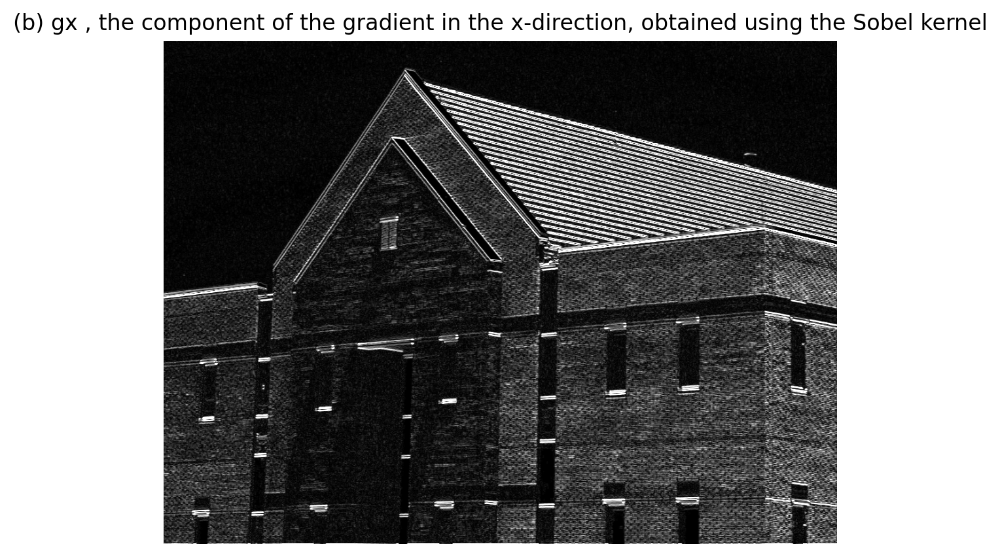

In [17]:
sobel_x,sobel_y,gradient=my_filter(image_data,3,width, height)

plt.figure(figsize=(18, 5), dpi=200)
plt.title("(b) gx , the component of the gradient in the x-direction, obtained using the Sobel kernel")
plt.imshow(np.abs(sobel_x), cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

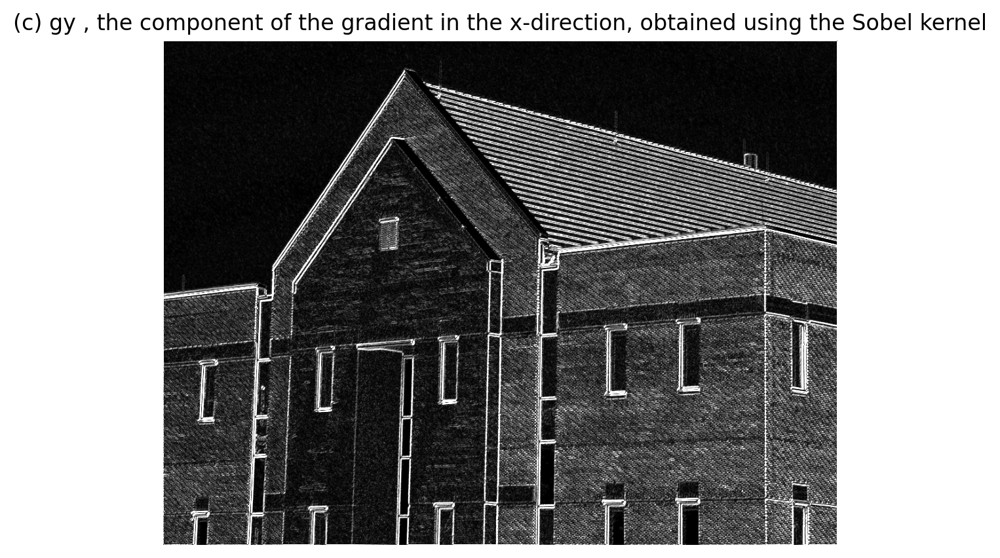

In [19]:
plt.figure(figsize=(18, 5), dpi=200)
plt.title("(c) gy , the component of the gradient in the x-direction, obtained using the Sobel kernel")
plt.imshow(np.abs(sobel_y), cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

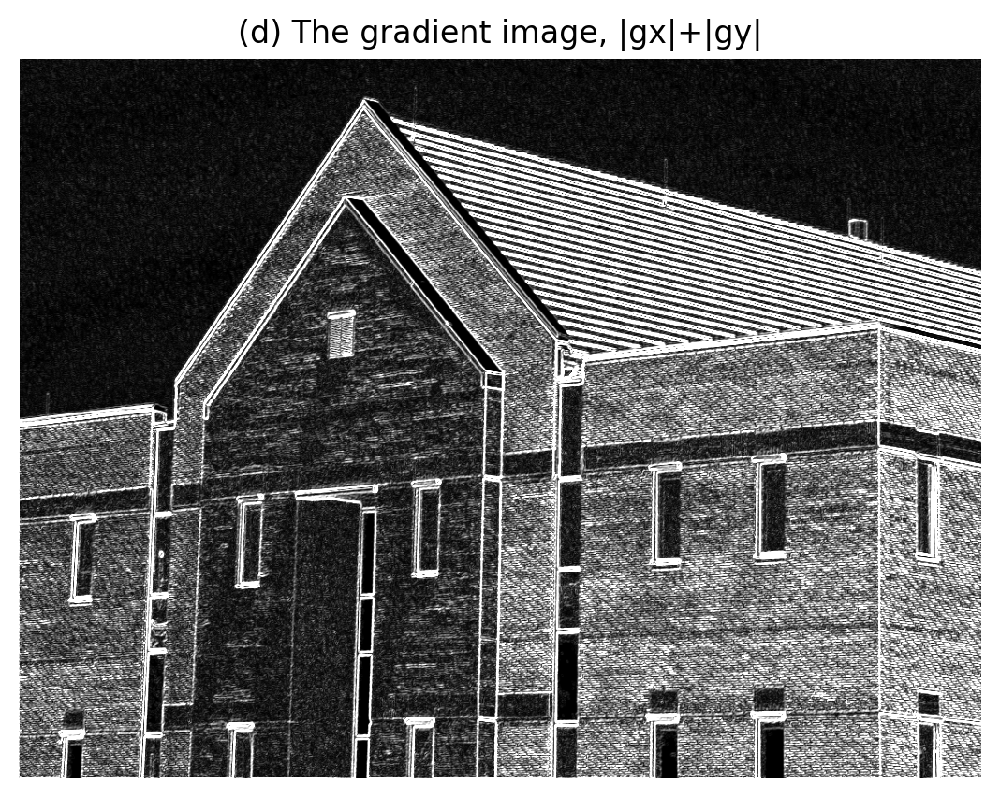

In [20]:
plt.figure(figsize=(18, 5), dpi=200)
plt.title("(d) The gradient image, |gx|+|gy|")
plt.imshow(gradient, cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

b şıkkında görüntüye x yönünde sobel filtre uygulandığında görüntüdeki yatay kısımlar belirginleşmiş, c şıkkında ise tam tersi y yönünde sobel filtre uygulandığında dikey kısımlar belirginleşmiştir. d şıkkında ise bunlar toplanmış ve kenarların hem yatayda hem dikeyde tespit edildiği bir görüntü elde edilmiştir.

## II) Figure 10.18

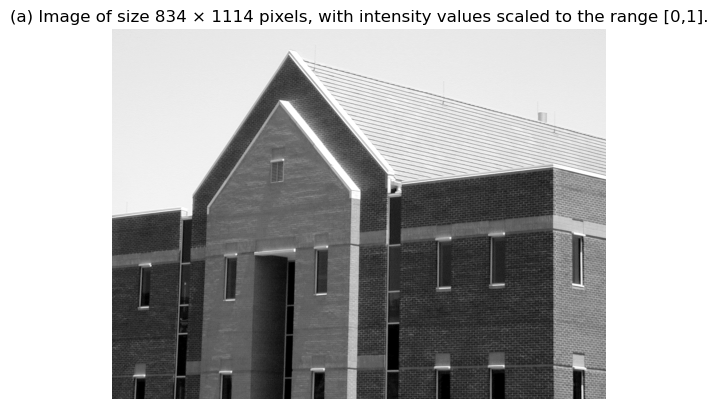

In [21]:
image_data, width, height, maxval = mypgmread('Fig1016(a)(building_original).pgm')

plt.title("(a) Image of size 834 × 1114 pixels, with intensity values scaled to the range [0,1].")
plt.imshow(image_data, cmap='gray')
plt.axis('off') 
plt.show()

In [22]:
def averageMaskFilter(data,size,width,height):
   
    data = np.array(data,dtype=np.uint8)
    
    padding = size // 2  # Ekstra sütun/satır sayısı, filtre boyutunun yarısı kadar

    #görüntü kenarındaki pikselleri korumak için 
    w = np.zeros((height + 2*padding, width + 2*padding))# w-> görüntü verisini çerçeveler filtre size ına göre 
    
    for i in range(0,height):    
        for j in range(0,width):
            w[i + padding][j + padding] = data[i][j]
            

    filtered = np.zeros((height,width))
    for i in range(0,height):
        for j in range(0,width):
            filtered[i][j] = int(np.mean(w[i:size+i,j:size+j]))#filtrelenmiş görüntü verisini tutar
            
    return filtered

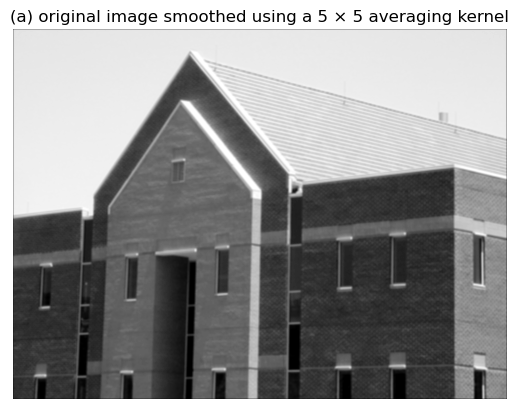

In [24]:

fig=averageMaskFilter(image_data,5,width,height)
plt.title("(a) original image smoothed using a 5 × 5 averaging kernel")
plt.imshow(fig, cmap='gray')
plt.axis('off') 
plt.show()

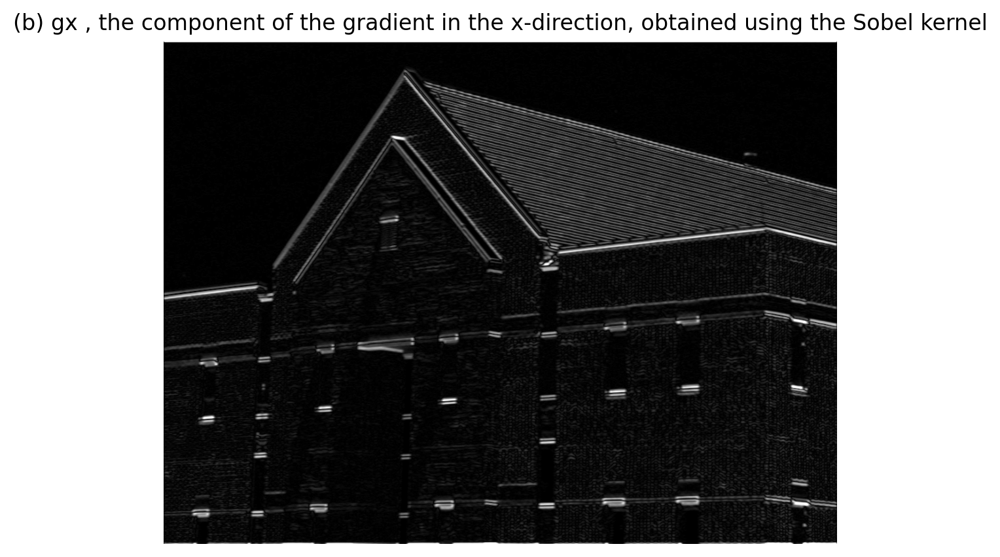

In [25]:
sobel_x,sobel_y,gradient=my_filter(fig,3,width, height)

plt.figure(figsize=(18, 5), dpi=200)
plt.title("(b) gx , the component of the gradient in the x-direction, obtained using the Sobel kernel")
plt.imshow(np.abs(sobel_x), cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

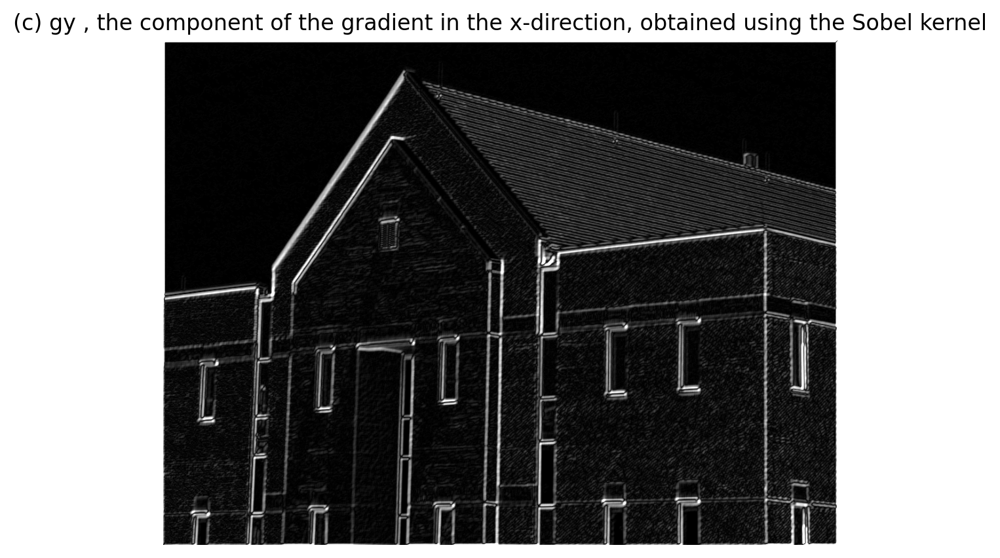

In [26]:
plt.figure(figsize=(18, 5), dpi=200)
plt.title("(c) gy , the component of the gradient in the x-direction, obtained using the Sobel kernel")
plt.imshow(np.abs(sobel_y), cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

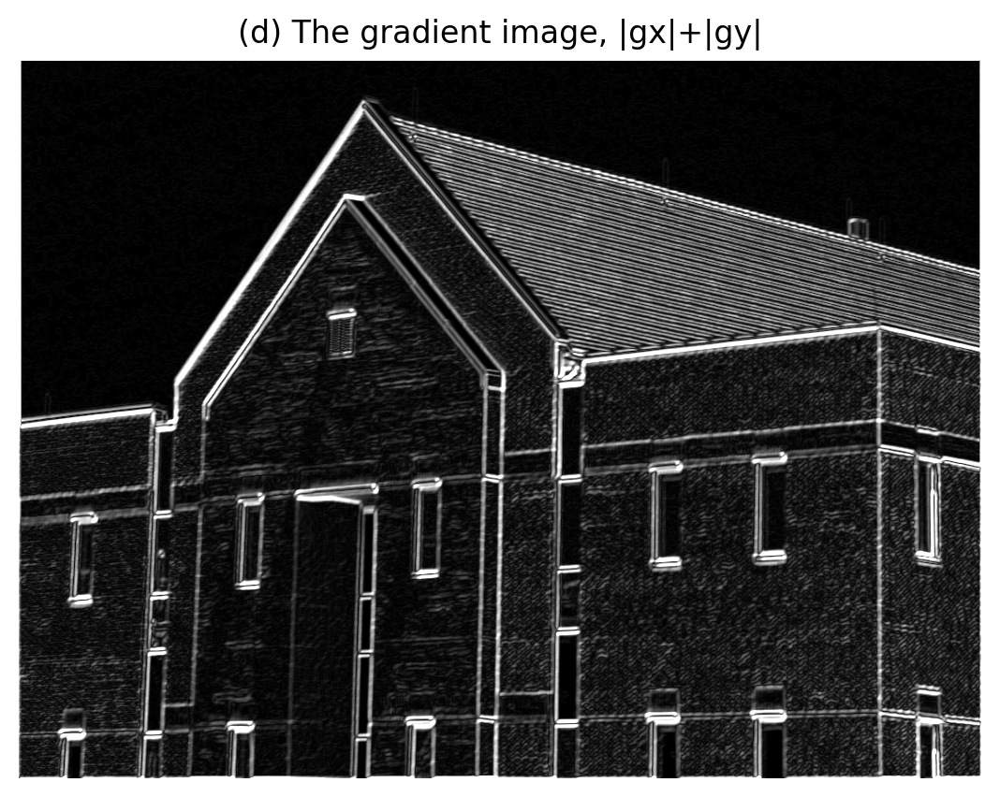

In [27]:
plt.figure(figsize=(18, 5), dpi=200)
plt.title("(d) The gradient image, |gx|+|gy|")
plt.imshow(gradient, cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()

Görüntü 5x5 average filter ile yumuşatıldığında yapılan sobel işlemleri daha iyi sonuç vermiş ve gürültüleri azalmıştır.

## III)  Figure 10.35

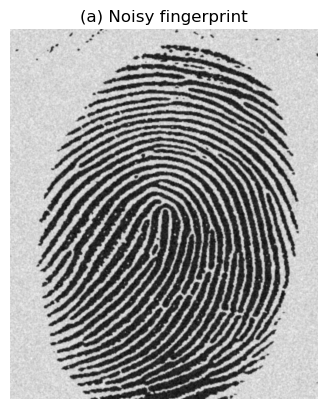

In [49]:
image_data, width, height, maxval = mypgmread('Fig1038(a)(noisy_fingerprint).pgm')

plt.title("(a) Noisy fingerprint")
plt.imshow(image_data, cmap='gray')
plt.axis('off') 
plt.show()

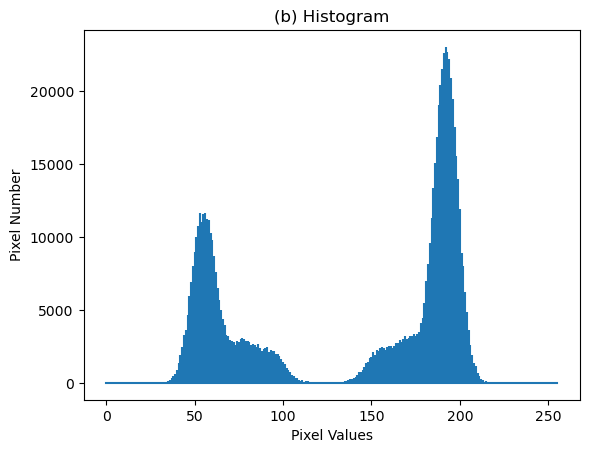

In [50]:
image=np.array(image_data)
histogramVector, _ = np.histogram(image.flatten(), bins=np.arange(255 + 2))
# orjinal görüntünün histogramını çizdir
fig, axs = plt.subplots()
axs.stem(histogramVector, linefmt='-', markerfmt='None', basefmt='')
axs.set_title('(b) Histogram')
axs.set_xlabel('Pixel Values')
axs.set_ylabel('Pixel Number')  

plt.show()


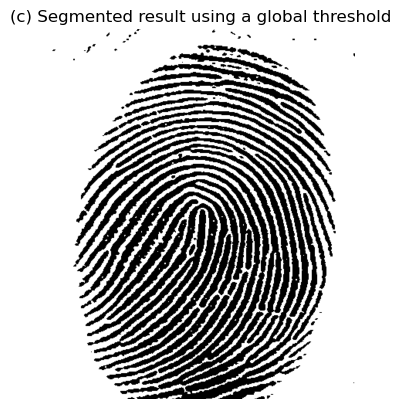

In [53]:
def threshold(image):
    image=np.array(image)
    for i in range(0,height):    
        for j in range(0,width):
            if(image[i][j])<= 125:                
                image[i][j]=0
            else:
                image[i][j]=255
    return image
image_data, width, height, maxval = mypgmread('Fig1038(a)(noisy_fingerprint).pgm')
thresh=threshold(image_data)
plt.title("(c) Segmented result using a global threshold")
plt.imshow(thresh, cmap='gray',vmin=0,vmax=255)
plt.axis('off') 
plt.show()                

Histogram grafiği incelendiğinde 127 değerinin iki grubu birbirinden ayırdığı gözlemlenmektedir. c şıkkındaki görüntüde bu değer threshold olarak kullanıldığında arka planın ve öndeki parmak izinin birbirinden net bir şekilde ayrıldığı görülmektedir.

## IV) Figure 10.45

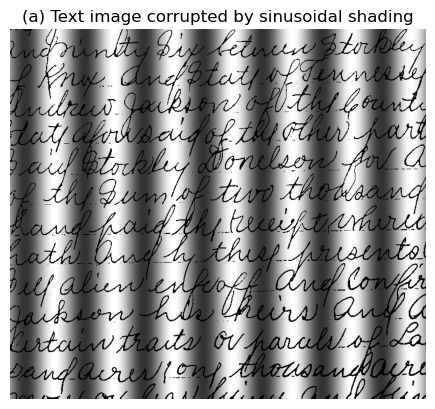

In [63]:
image_data, width, height, maxval = mypgmread('Fig1050(a)(sine_shaded_text_image).pgm')

plt.title("(a) Text image corrupted by sinusoidal shading")
plt.imshow(image_data, cmap='gray')
plt.axis('off') 
plt.show()

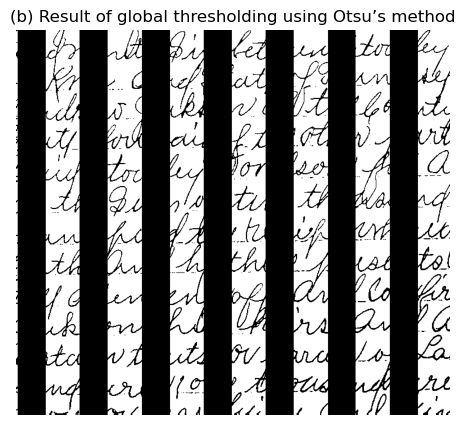

In [76]:
import numpy as np
image_data=np.array(image_data)
def otsu_threshold(image_data):

    hist, bins = np.histogram(image_data.flatten(), bins=256, range=[0, 256])

    # normalize et
    hist_norm = hist / hist.sum()

    # Variables for optimization
    max_variance = 0
    threshold = 0

    
    for t in range(1, 256):
        w0 = hist_norm[:t].sum()
        w1 = hist_norm[t:].sum()

        #sınıfların ortalamasını hesapla
        mean0 = (hist_norm[:t] * np.arange(t)).sum() / (w0 + 1e-10)
        mean1 = (hist_norm[t:] * np.arange(t, 256)).sum() / (w1 + 1e-10)

        #sınıfların varyansını hesapla
        var0 = (hist_norm[:t] * ((np.arange(t) - mean0) ** 2)).sum() / (w0 + 1e-10)
        var1 = (hist_norm[t:] * ((np.arange(t, 256) - mean1) ** 2)).sum() / (w1 + 1e-10)

        #sınıflar arası varyansı hesapla
        variance = w0 * w1 * ((mean0 - mean1) ** 2)

        #varyansın mevcut maksimum varyanstan büyük olması durumunda eşiği güncelle
        if variance > max_variance:
            max_variance = variance
            threshold = t

    return threshold
# otsuyu uygula
threshold_value = otsu_threshold(image_data)

# bulunan thresholdu uygula
def threshold(image,threshold):
    image=np.array(image)
    for i in range(0,height):    
        for j in range(0,width):
            if(image[i][j])<= threshold:                
                image[i][j]=0
            else:
                image[i][j]=255
    return image

otsu_image=threshold(image_data,threshold_value)

# Display the original and thresholded images
plt.figure(figsize=(10, 5))
plt.title("(b) Result of global thresholding using Otsu’s method")
plt.imshow(otsu_image, cmap='gray')
plt.axis('off')
plt.show()



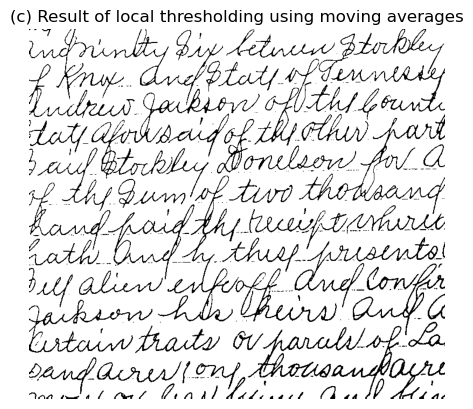

In [84]:
image_data=np.array(image_data)
def moving_average_threshold(image_data, window_size, n, b):
    thresholded_image = np.zeros_like(image_data)

    for i in range(0, image_data.shape[0], window_size):
        for j in range(0, image_data.shape[1], window_size):
           
            window = image_data[i:i+window_size, j:j+window_size]

            # ortalamayı hesapla
            local_mean = np.mean(window)

            # thresholdu belirle
            threshold = b * local_mean
            thresholded_window = np.where(window > threshold, 255, 0)
            
            thresholded_image[i:i+window_size, j:j+window_size] = thresholded_window

    return thresholded_image

# kitaptaki parametreler ayarlandı
average_width = 4
n = 5 * average_width # 20 kere uygula
b = 0.5

# moving average local thresholding uygula
window_size = n  
thresholded_image = moving_average_threshold(image_data, window_size, n, b)

# threshold uygulanmış görüntü
plt.title("(c) Result of local thresholding using moving averages")
plt.imshow(thresholded_image, cmap='gray')
plt.axis('off') 
plt.show()

Otsu’nun eşikleme yöntemi, tüm olası eşik değerlerini yinelemeyi ve eşiğin her iki tarafındaki piksel seviyeleri için bir yayılma ölçüsü hesaplamayı içerir, yani ön planda veya arka planda düşen pikseller. Amaç, ön plan ve arka plan yayılmalarının toplamının minimumda olduğu eşik değerini bulmaktır. Otsu threshold uygulanan görüntüyü incelediğimizde b şıkkındaki görüntüde koyu kısımların daha siyah, açık renk kısımların ise daha beyaz olduğu sadece 2 renkten oluşan bir görüntü elde edilmiştir.

c şıkkında moving_average_threshold işleminde, giriş görüntüsüne hareketli ortalamaya dayalı bir yerel eşikleme uygular. Görüntüyü örtüşmeyen yerel pencerelere böler ve her pencere için yerel ortalamayı hesaplar. Yoğunluğu yerel ortalamanın üzerinde olan pikseller 255'e (beyaz), yerel ortalamanın altındaki pikseller ise 0'a (siyah) ayarlanır. 